**Author:** Elias Rafael Ruiz-Morales

**Institution:** Wellcome Sanger institute

**August, 2023**

Here I re-annotate the trophoblasts by including cell sub-types. I also calculate the marker genes of each cell identity and the DE genes of Tg-infected vs Uninfected tissue.


---

# Fine annotation of trophoblast at 48hpi


In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import os
import sys
import anndata

import matplotlib.pyplot as plt
import matplotlib as mpl
import gc


In [3]:

#For TF-IDF
import episcanpy as epi
from sklearn.feature_extraction.text import TfidfTransformer

In [4]:
#adata_ExplantNorm=sc.read('../results/scVI/S9_scVIintegrated_fetalSurgSubset_adata_latent20_20220523.h5ad')

In [2]:
def MovePlots(plotpattern, subplotdir):
    os.system('mkdir -p '+str(sc.settings.figdir)+'/'+subplotdir)
    os.system('mv '+str(sc.settings.figdir)+'/*'+plotpattern+'** '+str(sc.settings.figdir)+'/'+subplotdir)

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.figdir = '../results/images/integrated/annotationFine/'
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80)  # low dpi (dots per inch) yields small inline figures

sys.executable

-----
anndata     0.7.5
scanpy      1.7.1
sinfo       0.3.1
-----
PIL                 8.1.2
anndata             0.7.5
anyio               NA
attr                20.3.0
babel               2.9.0
backcall            0.2.0
brotli              NA
cairo               1.20.0
certifi             2020.12.05
cffi                1.14.5
chardet             4.0.0
cloudpickle         1.6.0
colorama            0.4.4
cycler              0.10.0
cython_runtime      NA
cytoolz             0.11.0
dask                2021.03.1
dateutil            2.8.1
decorator           4.4.2
fsspec              0.8.7
get_version         2.1
google              NA
h5py                3.1.0
idna                2.10
igraph              0.8.3
ipykernel           5.5.0
ipython_genutils    0.2.0
jedi                0.18.0
jinja2              2.11.3
joblib              1.0.1
json5               NA
jsonschema          3.2.0
jupyter_server      1.4.1
jupyterlab_server   2.3.0
kiwisolver          1.3.1
legacy_api_wrap     0.0.0


'/opt/conda/bin/python'

In [3]:
def identityTransfer(adata_CellsNewID, adata, field='cell_type'):
    
    '''
    Function to transfer the value in a .obs column, modifying only the cells included in adata_CellsNewID
    
    Parameters:
        adata_CellsNewID: anndata object with cells. These should have in their .obs[field] the new values to be transfer to adata
        adata: anndata object to modify. The value in .obs[field] will be modifies for all the cells in adata_CellsNewID
        field: column name in .obs to operate in.
        
     Return:
        anndata object with the metadata modified
        
    '''
    
    #converting categorical into strings to introduce new categories
    adata.obs[field]=adata.obs[field].astype("string")


    #assigning the new categories to the cells in adata
    for cell in adata_CellsNewID.obs.index:
        adata.obs[field][cell] = adata_CellsNewID.obs[field][cell]

    #Returning strings into categorical 
    adata.obs[field]=adata.obs[field].astype("category")
    
    return(adata)

In [4]:
def runTF_IDF(adata, groupby, method='wilcoxon'):
    
    '''
    Function to run TF-IDF and DE analysis. TF-IDF means term-frequency times inverse document-frequency. 
    Its goal is to scale down the impact of tokens that occur very frequently (i.e. less informative)
    than features that occur in a small fraction of the training corpus.
    The the function applies a DE analysis.
    
    Parameters:
        adata: anndata object with cells.
        groupby: column name in .obs to make the DE comparison.
        method: method to use for Differential expression.
    
    Return:
        anndata object with the DE genes stored in adata.uns['rank_genes_groups']
        
    '''
    
    
    counts = anndata.AnnData(X=adata.raw.X, var=adata.raw.var, obs=adata.obs, asview=False)


    #-- Binarize counts matrix (1 if expressed, 0 otherwise)
    adata_bin = epi.pp.binarize(counts, copy=True)
    adata_bin.X.shape


    #-- Compute TF-IDF
    transformer = TfidfTransformer()
    tfidf = transformer.fit_transform(adata_bin.X.T)
    adata_bin.X = tfidf.T
    adata_bin.X.shape


    #-- Compute Mann-Withney test with scanpy
    sc.tl.rank_genes_groups(adata_bin, groupby= groupby, use_raw=False, method=method)

    return(adata_bin)

In [5]:
def Barplot(which_var, adata, var='identity', height=3, color = False, suffix= '', fig_format='svg'):
    
    '''
    Function to plot barplots plotting the proportion of cells per catergory in var, coming from each category in which_var.
    
    Parameters:
        which_var: column name in .obs. Contains the categories to contrast.
        adata: anndata object.
        var: column name in .obs. It contains the categories of the cells.
        height: plot height
        color: colors to use
        suffix: string. Suffix to be added at the end of the name of the plot.
    
    Return:
        Saves bar plot as a pdf.
        
    '''
    
    plotdata = pd.crosstab(adata.obs[var], adata.obs[which_var], normalize='index') * 100
    if 'category' in plotdata.index.dtype.name:
        plotdata.index.reorder_categories(adata.obs[var].cat.categories[::-1])

    if not color:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False)
    else:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False, color = color)
    ax1.set_title(which_var+' %')
    ax1.set_ylabel(var)
    ax1.set_xlim(0, 100)
    horiz_offset = 1
    vert_offset = 1.
    ax1 = ax1.legend(bbox_to_anchor = (horiz_offset, vert_offset))
    ax1.figure.savefig(str(sc.settings.figdir)+'/barplot_'+var+'_proportions_'+which_var+ suffix+'.'+fig_format, bbox_inches='tight',
                       dpi=300, orientation='landscape', format= fig_format, optimize=True)

In [6]:
sc.set_figure_params(figsize=(6,6))

In [7]:
#reading the modified object
adata=sc.read('../results/scVI/rna6c_scVIintegrated_Clean_adata_20230707.h5ad')

In [8]:
#LATENT 30
sc.pp.neighbors(adata, n_neighbors=20, use_rep="X_scVI_n_latent_30")
sc.tl.umap(adata)

#clustering
sc.tl.leiden(adata, key_added="leiden_scvi", resolution=0.3)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:33)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:40)
running Leiden clustering
    finished: found 7 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:00:06)


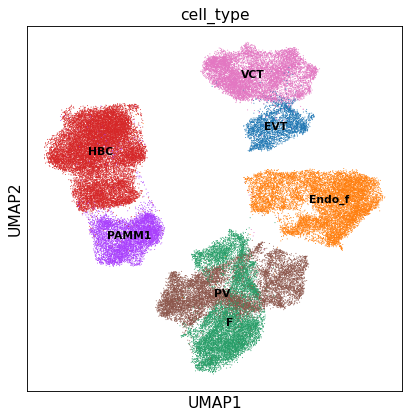

In [9]:
# use scVI imputed values for plotting
sc.pl.umap(adata, color=['cell_type' ], legend_loc='on data',legend_fontsize='x-small', size=3)

In [10]:
adata

AnnData object with n_obs × n_vars = 68835 × 36601
    obs: 'sample', 'stage', 'hpi', 'infection', 'percent_mito', 'n_counts', 'batch', 'sample_barcode', 'assignment_SoC', 'donor_id', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'infection_stage', 'S_score', 'G2M_score', 'phase', 'n_genes_by_counts', 'total_counts', 'total_counts_hs', 'pct_counts_hs', 'total_counts_tg', 'pct_counts_tg', 'Tg_infected', 'n_genes', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'leiden_scvi', 'celltype_predictions', 'probabilities', 'scrublet_doublet', 'cell_type', 'souporcell_MFgenotype', 'MFgenotype', 'cell_type_broad'
    var: 'gene_ids', 'feature_types', 'mean-0', 'std-0', 'mean-1', 'std-1', 'mean-2', 'std-2', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'MFgenotype_colors', '_scvi', 'cell_type_colors', 'celltype_predictions_colors', 'donor_id_colors', 'hpi_colors', 'hvg', 'infection

### Re-annotating the Trophoblast sub-populations

I will explore the annotation reported Anna Arutyunyan:

 

In [11]:
Trophoblasts = sc.read('../results/scVI/rna6_scVIintegrated_latent20_Trophoblasts_20230707.h5ad')

In [12]:
#Normalize and scale data to run neirest neighbors and plot gene expression
sc.pp.normalize_total(Trophoblasts, target_sum=1e4)
sc.pp.log1p(Trophoblasts)

normalizing counts per cell
    finished (0:00:00)


In [13]:
#LATENT 30
sc.pp.neighbors(Trophoblasts, n_neighbors=15, use_rep="X_scVI_n_latent_30")
sc.tl.umap(Trophoblasts)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)


running Leiden clustering
    finished: found 11 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:00:01)


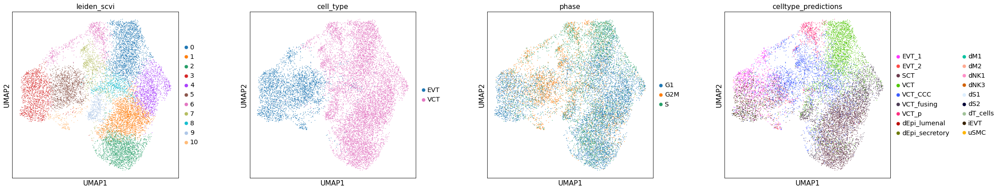

In [14]:
#clustering
sc.tl.leiden(Trophoblasts, key_added="leiden_scvi", resolution=0.7)


sc.pl.umap(Trophoblasts, color=["leiden_scvi",'cell_type','phase','celltype_predictions'],
           wspace=0.3, size=6)

### Loading the predictions using the trophoblasts from the MFI as training set
Only the trophoblasts were annotated.

In [15]:
#Loading the predictions using 
prediction= pd.read_csv('../results/log_regression/logreg_trophoblastOnly_to_explant_HVGs_predictions_20230707_48h.csv', index_col=0)

In [16]:
prediction

,celltype_predictions,probabilities
Pla_HDBR13007976_AAACCCAAGCTGTTAC,VCT_fusing,0.769606
Pla_HDBR13007976_AAACCCACACTAAACC,SCT,0.999999
Pla_HDBR13007976_AAACCCACACTACGGC,SCT,0.999349
Pla_HDBR13007976_AAACCCACAGCAGTCC,SCT,0.998724
Pla_HDBR13007976_AAACCCACAGGTTCGC,EVT_2,0.950091
...,...,...
Pla_HDBR13661576_TTTGATCCACACAGCC,EVT_1,0.958306
Pla_HDBR13661576_TTTGGAGTCATAGAGA,iEVT,0.985123
Pla_HDBR13661576_TTTGGTTCAGATACCT,SCT,0.999324
Pla_HDBR13661576_TTTGGTTTCGTTCGCT,SCT,0.999721


In [17]:
#Changing names to differentiate the new from the old predictions
prediction['celltype_predictionsTrophOnly']= prediction['celltype_predictions']
prediction['probabilitiesTrophOnly']= prediction['probabilities']

prediction= prediction.drop(columns=['celltype_predictions', 'probabilities'])

In [18]:
#Adding the predictions to the metadata
Trophoblasts.obs= Trophoblasts.obs.join(prediction)

In [19]:
sc.set_figure_params(figsize=(4,4))

... storing 'celltype_predictionsTrophOnly' as categorical


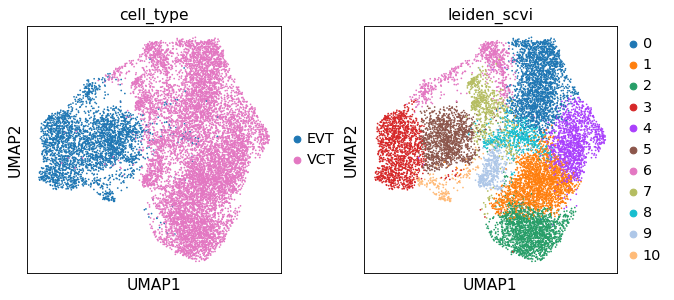

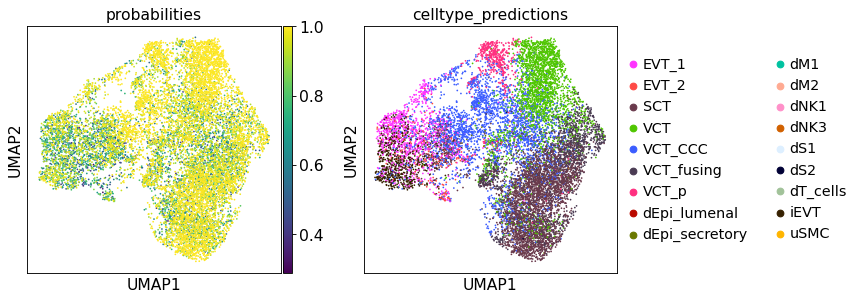

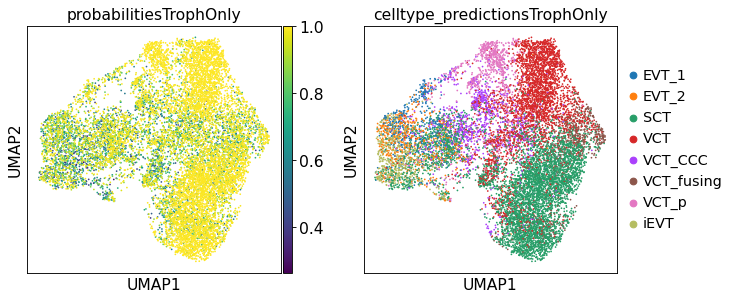

In [20]:
sc.pl.umap(Trophoblasts, color=['cell_type', "leiden_scvi"])
sc.pl.umap(Trophoblasts, color=['probabilities','celltype_predictions'])
sc.pl.umap(Trophoblasts, color=['probabilitiesTrophOnly','celltype_predictionsTrophOnly'])

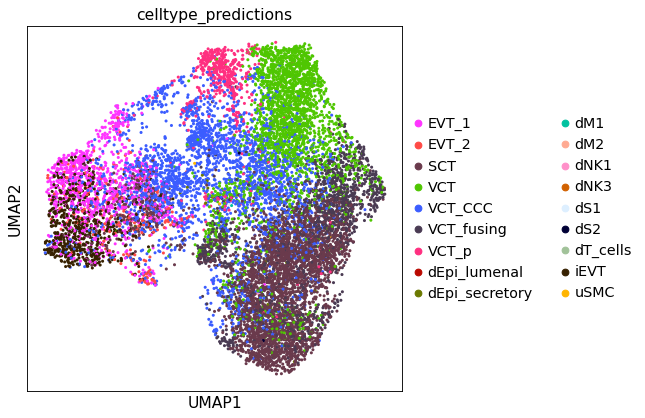

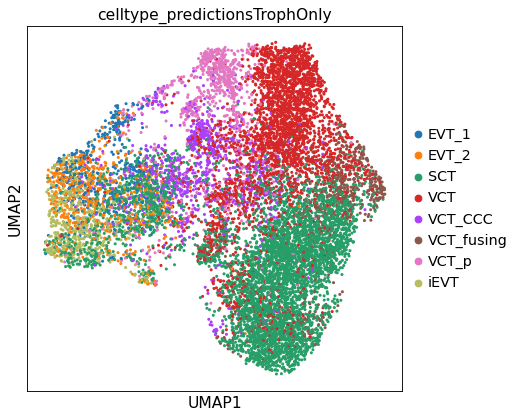

In [24]:
sc.set_figure_params(figsize=(6,6))
sc.pl.umap(Trophoblasts, color=['celltype_predictions'], size=30)
sc.pl.umap(Trophoblasts, color=['celltype_predictionsTrophOnly'], size=30)

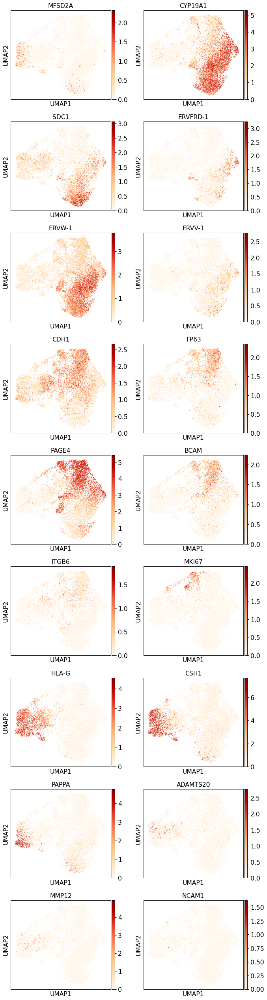

In [25]:
sc.set_figure_params(figsize=(4,4))

sc.pl.umap(Trophoblasts, color=['MFSD2A', #SCT
                                'CYP19A1','SDC1',#VCT-fusing & SCT
                                'ERVFRD-1','ERVW-1','ERVV-1', #VCT-fusing
                                'CDH1','TP63','PAGE4','BCAM',  #VCT
                                'ITGB6',#VCT-CCC
                                'MKI67', #VCT-P
                         'HLA-G', 'CSH1', 'PAPPA',#EVT
                         'ADAMTS20', #EVT1/2
                         'MMP12','NCAM1',  #eEVT
                         ], color_map='OrRd', size=8, ncols=2)

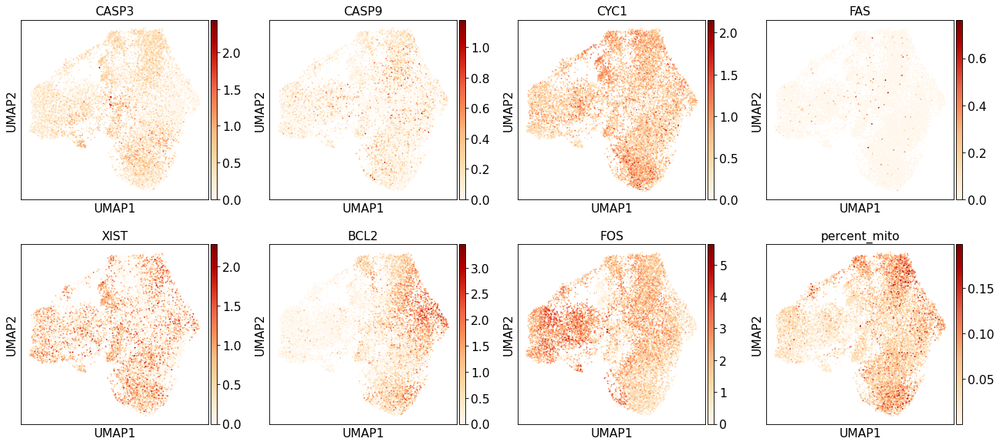

In [31]:
sc.pl.umap(Trophoblasts, color=['CASP3', 'CASP9', 'CYC1','FAS','XIST','BCL2','FOS', 'percent_mito'],
           color_map='OrRd', size=10)

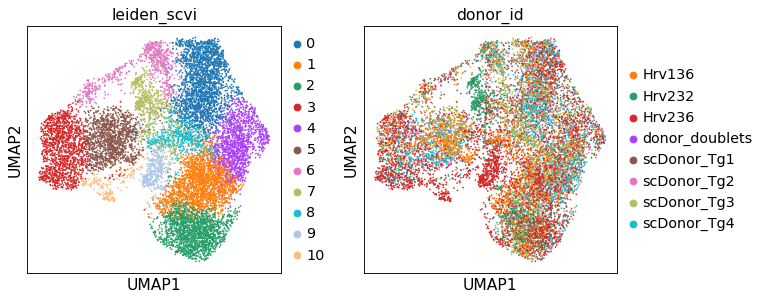

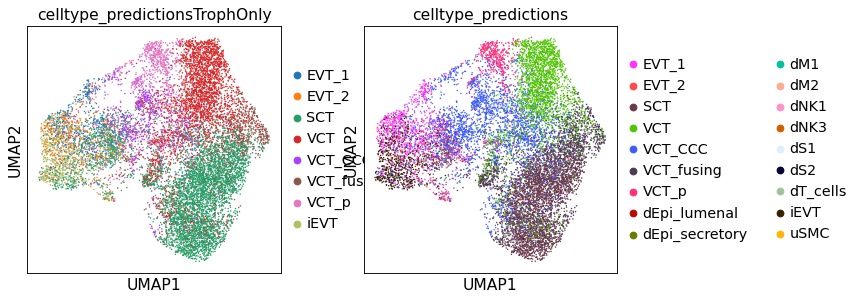

In [28]:
sc.pl.umap(Trophoblasts, color=["leiden_scvi",'donor_id'])
sc.pl.umap(Trophoblasts, color=["celltype_predictionsTrophOnly","celltype_predictions"], size=7)

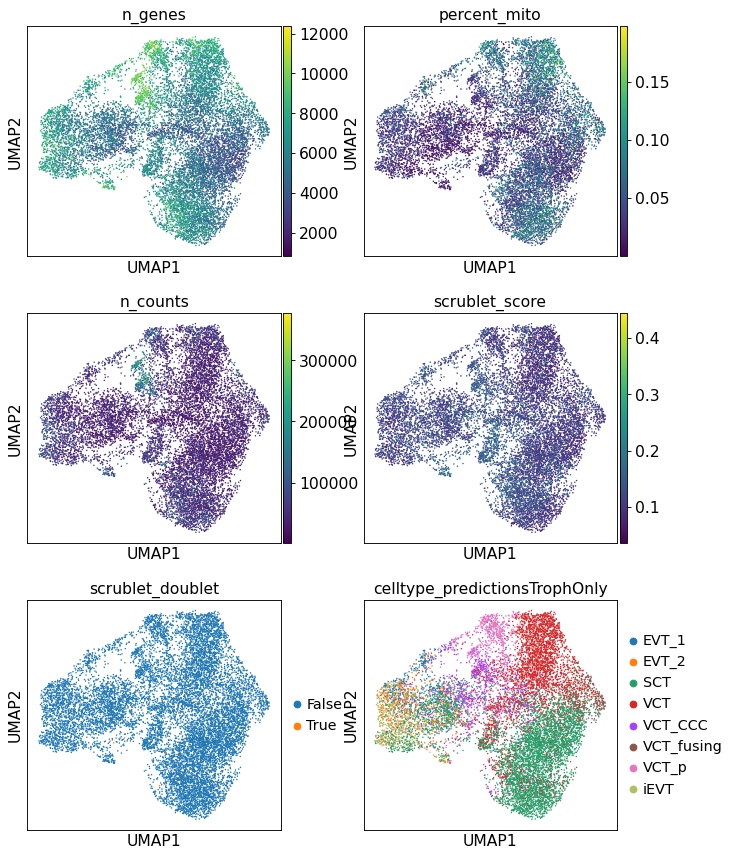

In [33]:
sc.pl.umap(Trophoblasts, color=["n_genes",'percent_mito','n_counts',
                         'scrublet_score','scrublet_doublet', 'celltype_predictionsTrophOnly' ], ncols=2, size=7)

In [21]:
#COpying the value of the leiden cluster. The new column will help to change it's values for
# the cluster identity
Trophoblasts.obs['cell_type']= Trophoblasts.obs['leiden_scvi']




#Function that changes the cluster names as indicated
Trophoblasts.obs['cell_type'] = (Trophoblasts.obs["leiden_scvi"].map(lambda x: 
                            {"0": "VCT", "1": "VCT_fusing", "2": "VCT_fusing", "3": "EVT", "4": "VCT_fusing","5": "EVT",
                            "6": "VCT_p", "7": "VCT_CCC", "8": "VCT_CCC", "9": "lowQC", "10": "EVT"}
                            .get(x, x)).astype("category"))

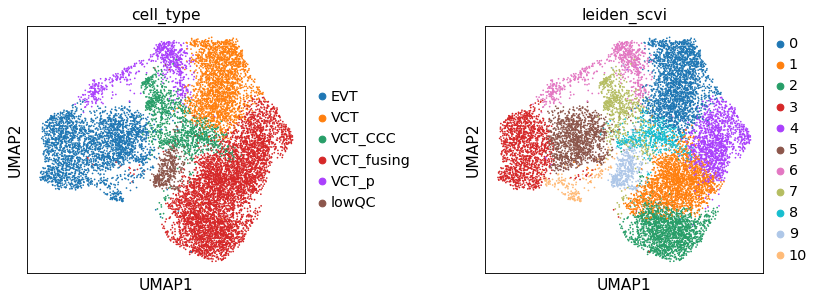

In [22]:
sc.pl.umap(Trophoblasts, color=['cell_type',"leiden_scvi"], wspace=0.5)

In [23]:
#Saving the modified object
Trophoblasts.write('../results/scVI/rna7_scVIintegrated_latent30_Trophoblasts_20230707.h5ad')

In [29]:
#Trophoblasts=sc.read('../results/scVI/rna7_scVIintegrated_latent20_Trophoblasts_20230707.h5ad')

## EVT Fine annotation

In [24]:
#Selecting the cells in the desired clusters
EVT = Trophoblasts[Trophoblasts.obs['cell_type'] == 'EVT']

#LATENT 30
sc.pp.neighbors(EVT, n_neighbors=15, use_rep="X_scVI_n_latent_30")
sc.tl.umap(EVT)


/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)


running Leiden clustering
    finished: found 8 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:00:00)


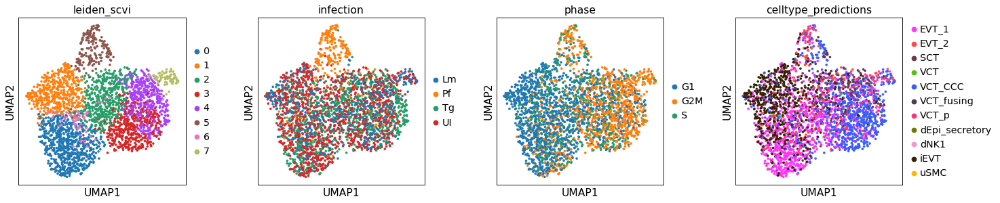

In [25]:

#clustering
sc.tl.leiden(EVT, key_added="leiden_scvi", resolution=0.8)


sc.pl.umap(EVT, color=["leiden_scvi",'infection','phase','celltype_predictions'],wspace=0.3)

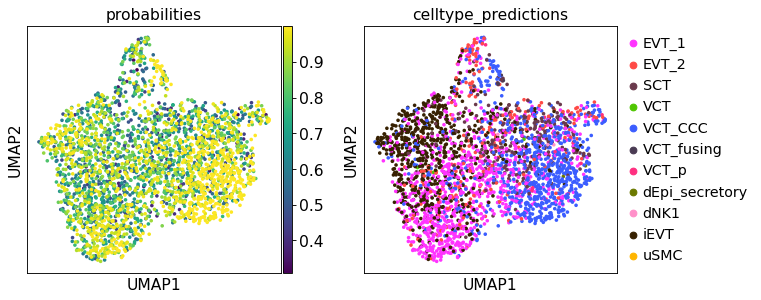

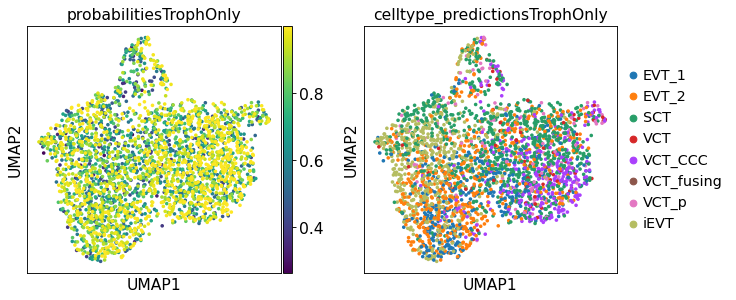

In [26]:
sc.pl.umap(EVT, color=['probabilities','celltype_predictions'])
sc.pl.umap(EVT, color=['probabilitiesTrophOnly','celltype_predictionsTrophOnly'])


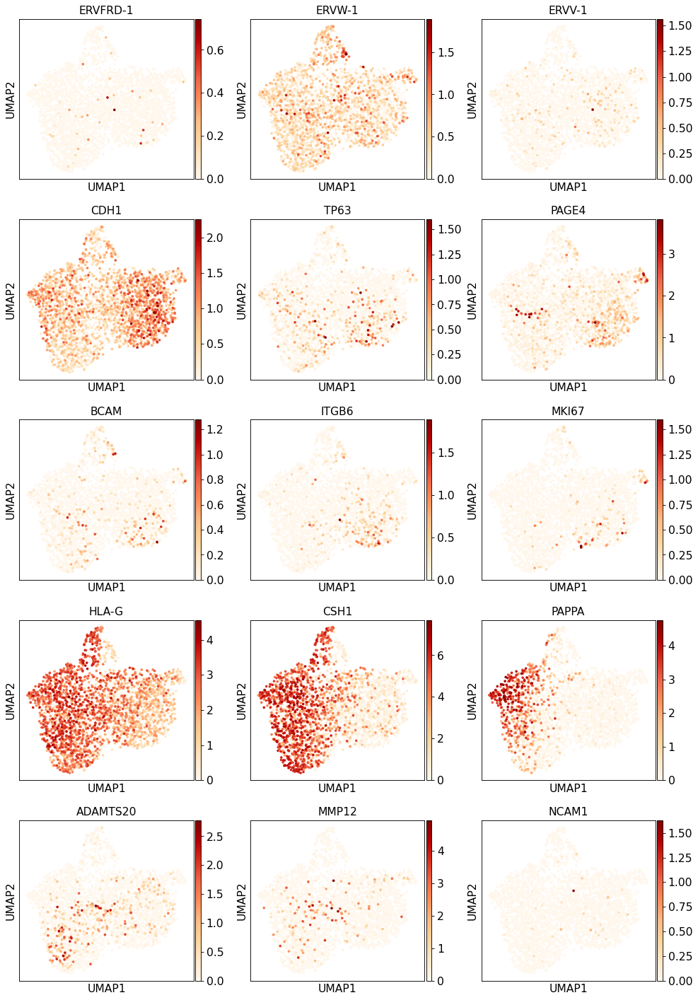

In [27]:
sc.pl.umap(EVT, color=['ERVFRD-1','ERVW-1','ERVV-1', #VCT-fusing
                       'CDH1','TP63','PAGE4','BCAM',  #VCT
                       'ITGB6',#VCT-CCC
                       'MKI67', #VCT-P
                         'HLA-G', 'CSH1', #EVT
                       'PAPPA',#iEVT
                         'ADAMTS20', #EVT1/2
                         'MMP12','NCAM1',  #eEVT
                         ], color_map='OrRd', ncols=3)

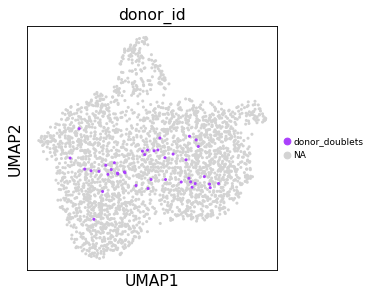

In [60]:
sc.pl.umap(EVT, color=['donor_id' ], legend_fontsize='xx-small', size=30, ncols=2, groups=['donor_doublets'], )


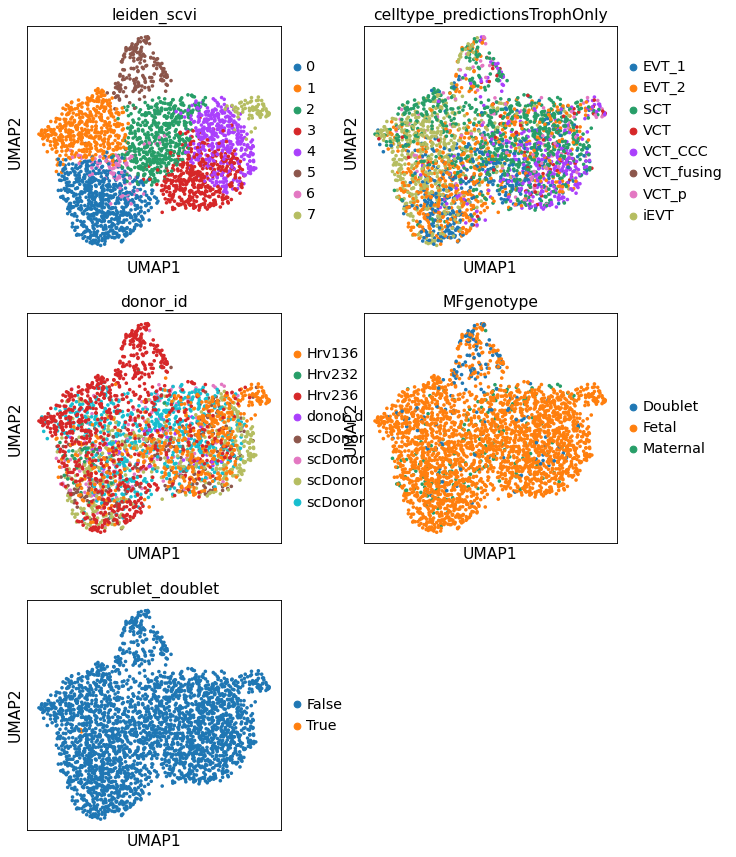

In [44]:
sc.pl.umap(EVT, color=['leiden_scvi','celltype_predictionsTrophOnly','donor_id','MFgenotype','scrublet_doublet'],ncols=2,
           color_map='OrRd')

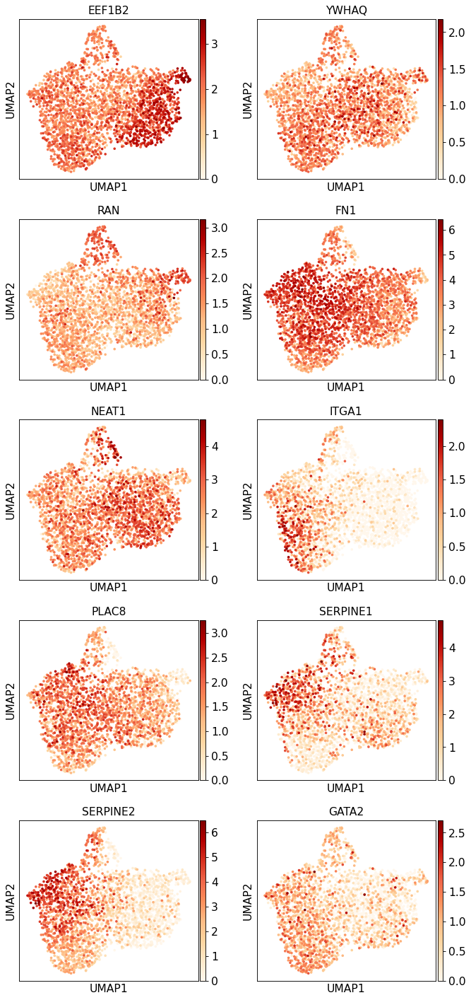

In [45]:
sc.pl.umap(EVT, color=['EEF1B2', 'YWHAQ','RAN',#EVT1. They proliferate!
                       'FN1','NEAT1','ITGA1','PLAC8',  #EVT2
                       'SERPINE1','SERPINE2',#iEVT
                        'GATA2' ], color_map='OrRd', ncols=2, )

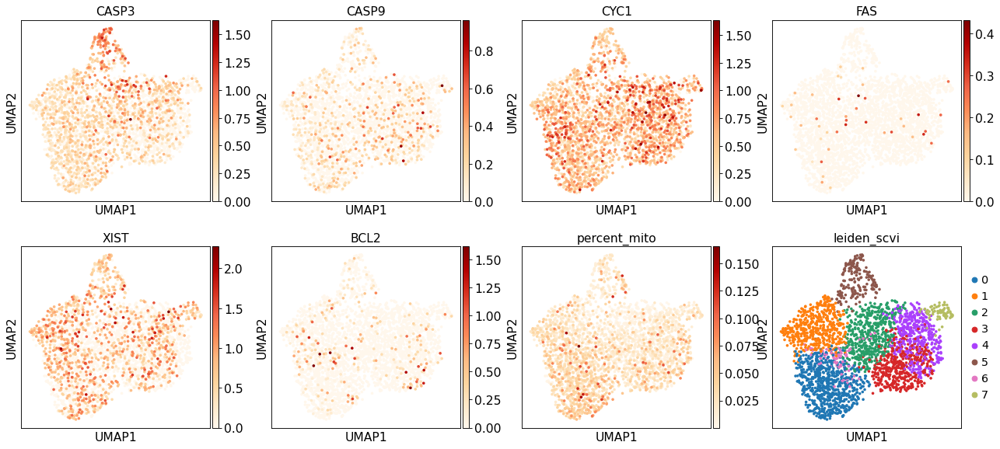

In [46]:
sc.pl.umap(EVT, color=['CASP3', 'CASP9', 'CYC1','FAS','XIST','BCL2', 'percent_mito','leiden_scvi'],
           color_map='OrRd')

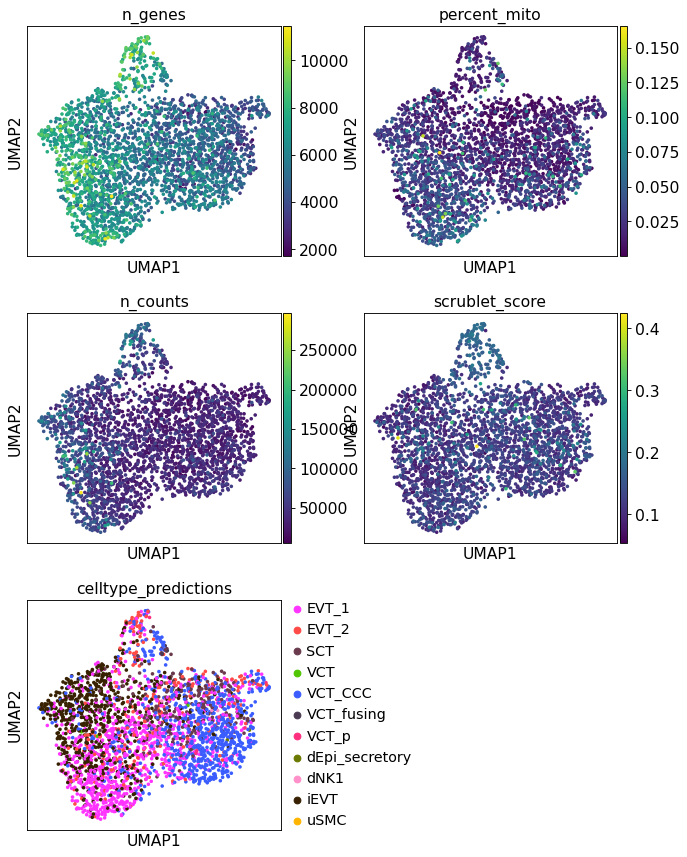

In [47]:
sc.pl.umap(EVT, color=["n_genes",'percent_mito','n_counts',
                         'scrublet_score', 'celltype_predictions' ], ncols=2)

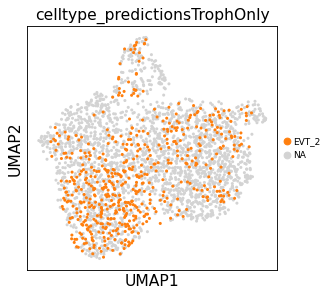

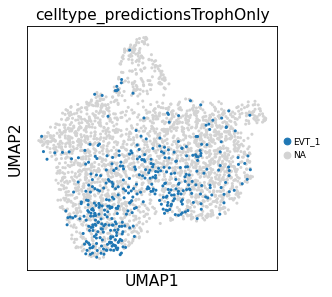

In [52]:
sc.pl.umap(EVT, color=['celltype_predictionsTrophOnly' ], legend_fontsize='xx-small', size=30, ncols=2, groups=['EVT_2'], )
sc.pl.umap(EVT, color=['celltype_predictionsTrophOnly' ], legend_fontsize='xx-small', size=30, ncols=2, groups=['EVT_1'], )

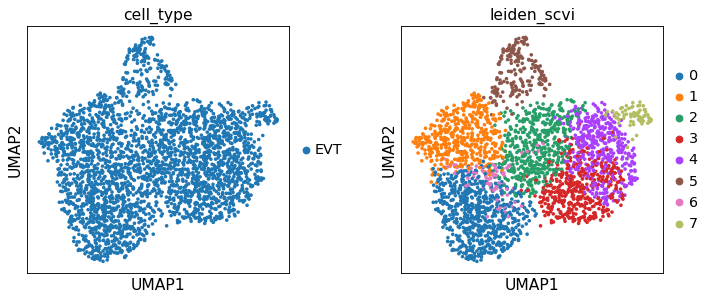

In [49]:
sc.pl.umap(EVT, color=['cell_type',"leiden_scvi"], wspace=0.3)

In [65]:
#COpying the value of the leiden cluster. The new column will help to change it's values for
# the cluster identity
EVT.obs['cell_type']= EVT.obs['leiden_scvi']


#Function that changes the cluster names as indicated
EVT.obs['cell_type'] = (EVT.obs["leiden_scvi"].map(lambda x: 
                            {"0": "EVT_2", "1": "iEVT", "2": "EVT_2", "3": "VCT_CCC", "4": "EVT_2","5": "lowQC",
                            "6": "EVT_2", "7": "lowQC"}
                            .get(x, x)).astype("category"))


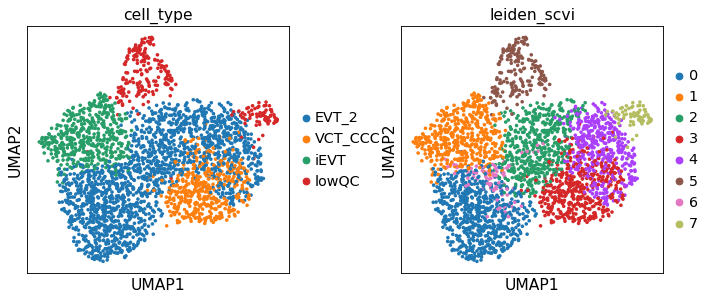

In [68]:
sc.pl.umap(EVT, color=['cell_type',"leiden_scvi"], wspace=0.3)

In [69]:
#Updating the new EVT annotation into the Trophoblast set
Trophoblasts= identityTransfer(EVT, Trophoblasts)

In [67]:
sc.set_figure_params(figsize=(4,4))

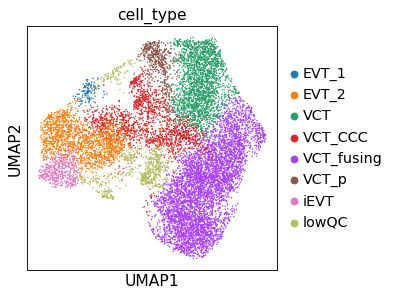

In [70]:
sc.pl.umap(Trophoblasts, color=['cell_type'], wspace=0.5, size=7)

In [45]:
del(EVT)
gc.collect()

101253

### Incresing granularity as cluster "VCT_p" clearly have a mix of VCTp and EVT_1 + lowQC

In [33]:
#Selecting the cells in the desired clusters
VCT = Trophoblasts[Trophoblasts.obs['cell_type'] == 'VCT_p']

#LATENT 30
sc.pp.neighbors(VCT, n_neighbors=11, use_rep="X_scVI_n_latent_30")
sc.tl.umap(VCT)


/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


running Leiden clustering
    finished: found 5 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:00:00)


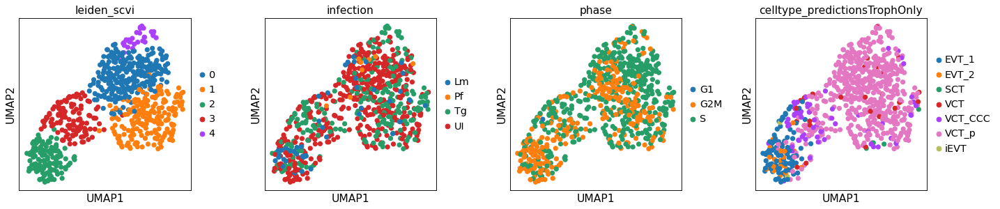

In [35]:

#clustering
sc.tl.leiden(VCT, key_added="leiden_scvi", resolution=0.5)


sc.pl.umap(VCT, color=["leiden_scvi",'infection','phase','celltype_predictionsTrophOnly'],wspace=0.3)

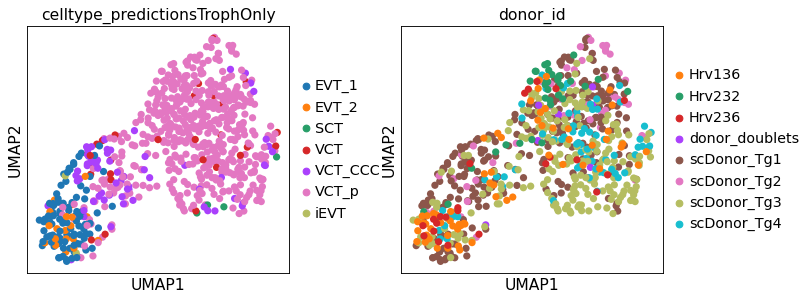

In [70]:
sc.pl.umap(VCT, color=['celltype_predictionsTrophOnly','donor_id'],wspace=0.3)


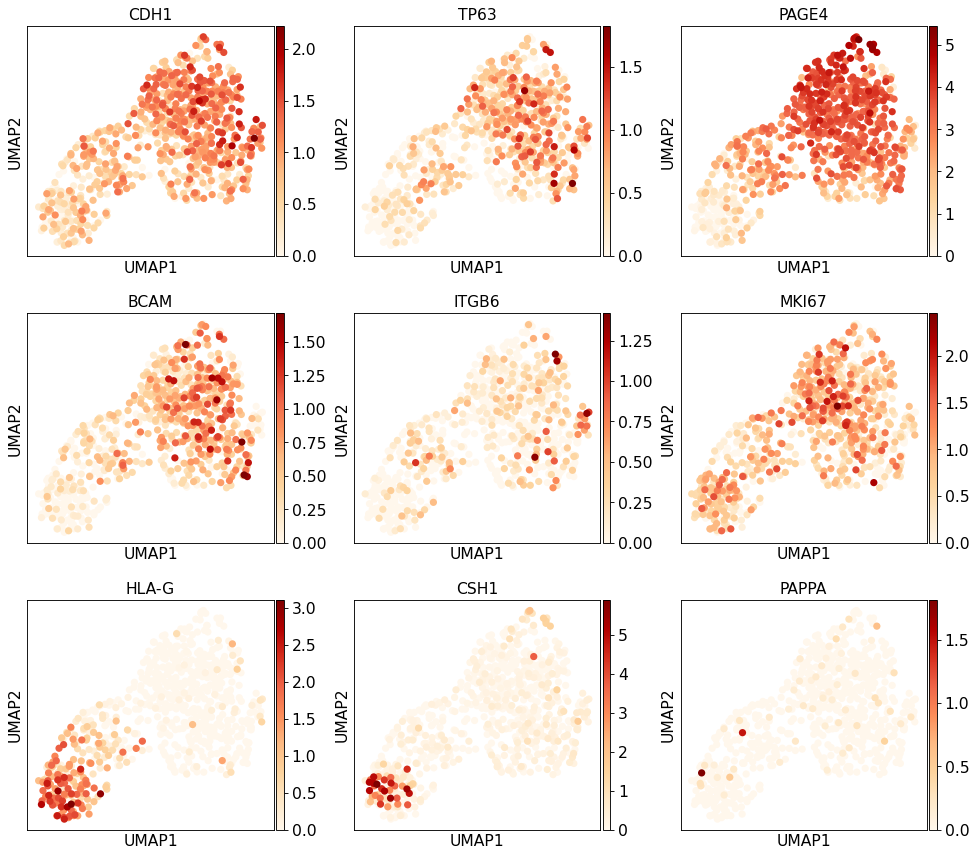

In [71]:
sc.pl.umap(VCT, color=['CDH1','TP63','PAGE4','BCAM',  #VCT
                       'ITGB6',#VCT-CCC
                       'MKI67', #VCT-P
                         'HLA-G', 'CSH1', #EVT
                       'PAPPA'
                         ], color_map='OrRd', ncols=3)

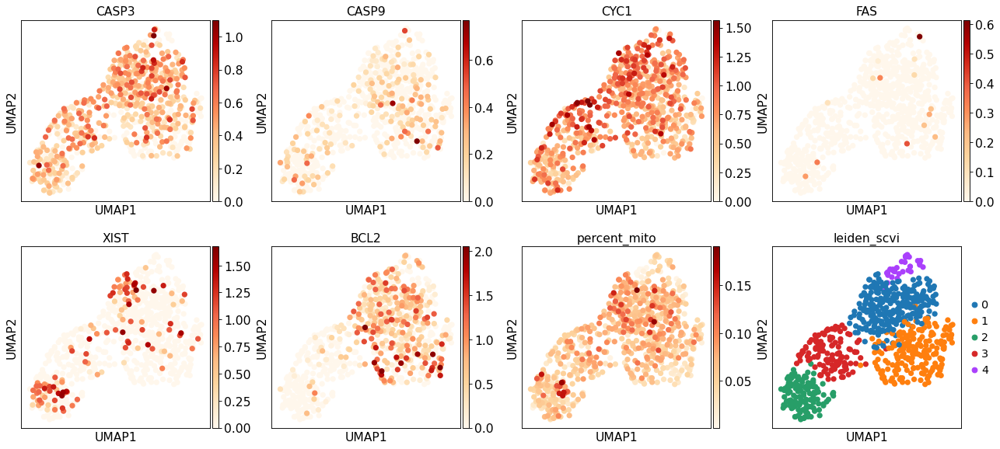

In [36]:
sc.pl.umap(VCT, color=['CASP3', 'CASP9', 'CYC1','FAS','XIST','BCL2', 'percent_mito','leiden_scvi'],
           color_map='OrRd')

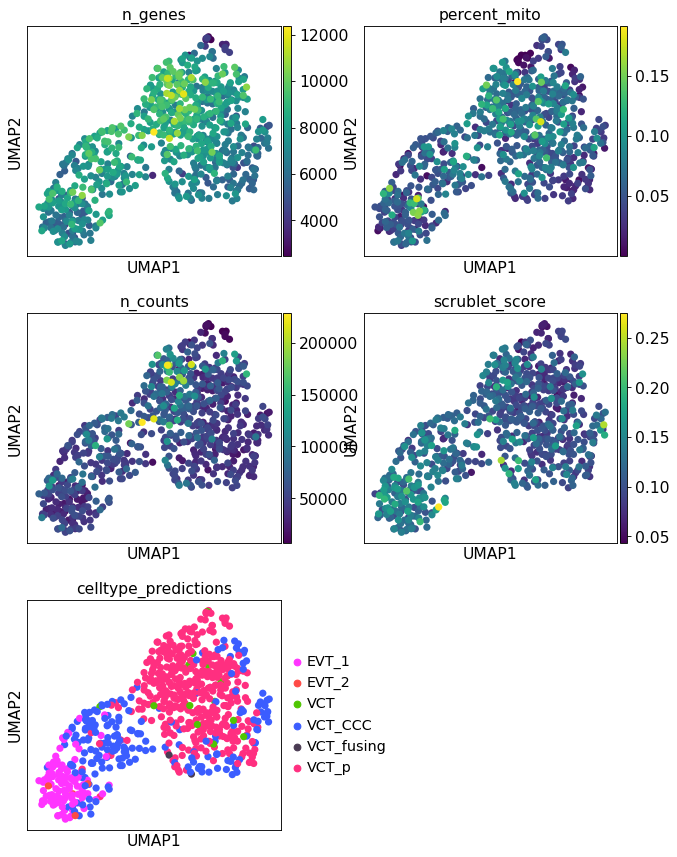

In [73]:
sc.pl.umap(VCT, color=["n_genes",'percent_mito','n_counts',
                         'scrublet_score', 'celltype_predictions' ], ncols=2)

In [38]:
#COpying the value of the leiden cluster. The new column will help to change it's values for
# the cluster identity
VCT.obs['cell_type']= VCT.obs['leiden_scvi']


#Function that changes the cluster names as indicated
VCT.obs['cell_type'] = (VCT.obs["leiden_scvi"].map(lambda x: 
                            {"0": "VCT_p", "1": "VCT_p", "2": "EVT_1", "3": "lowQC", "4": "VCT_p"}
                            .get(x, x)).astype("category"))


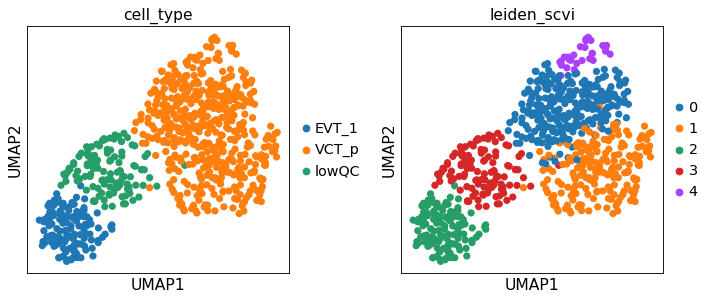

In [39]:
sc.pl.umap(VCT, color=['cell_type',"leiden_scvi"], wspace=0.3)

In [58]:
#Updating the new EVT annotation into the Trophoblast set
Trophoblasts= identityTransfer(VCT, Trophoblasts)

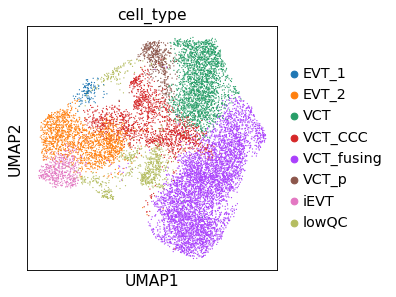

In [71]:
sc.pl.umap(Trophoblasts, color=['cell_type'], wspace=0.5, size=5)

## Updating the new Trophoblast annotation into the big data set

In [75]:
sc.set_figure_params(figsize=(6,6))

In [72]:
#Updating the new Trophoblast annotation into the big data set
adata= identityTransfer(Trophoblasts, adata)

In [78]:
adata = adata[adata.obs['cell_type'] != 'lowQC']
adata = adata[adata.obs['cell_type'] != 'doublets']

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


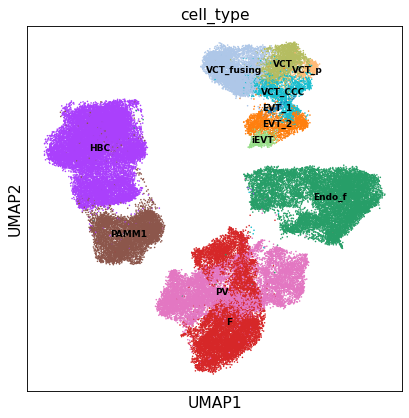

In [79]:
# use scVI imputed values for plotting
sc.pl.umap(adata, color=['cell_type' ], legend_loc='on data',legend_fontsize='xx-small', size=8)

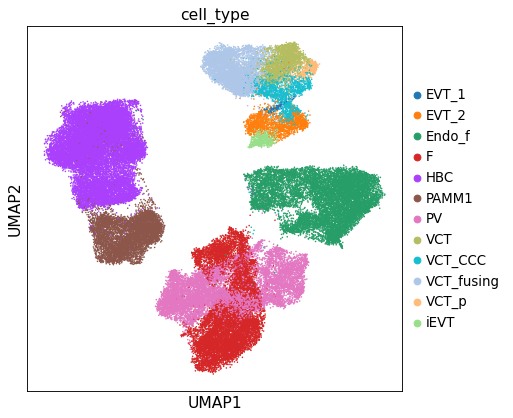

In [81]:
sc.pl.umap(adata, color=['cell_type' ],legend_fontsize=12, size=8)

In [82]:
adata

View of AnnData object with n_obs × n_vars = 68045 × 36601
    obs: 'sample', 'stage', 'hpi', 'infection', 'percent_mito', 'n_counts', 'batch', 'sample_barcode', 'assignment_SoC', 'donor_id', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'infection_stage', 'S_score', 'G2M_score', 'phase', 'n_genes_by_counts', 'total_counts', 'total_counts_hs', 'pct_counts_hs', 'total_counts_tg', 'pct_counts_tg', 'Tg_infected', 'n_genes', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'leiden_scvi', 'celltype_predictions', 'probabilities', 'scrublet_doublet', 'cell_type', 'souporcell_MFgenotype', 'MFgenotype', 'cell_type_broad'
    var: 'gene_ids', 'feature_types', 'mean-0', 'std-0', 'mean-1', 'std-1', 'mean-2', 'std-2', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'MFgenotype_colors', '_scvi', 'cell_type_colors', 'celltype_predictions_colors', 'donor_id_colors', 'hpi_colors', 'hvg', 'i

#### Creating a BROAD ANNOTATION category

In [83]:
#Assigning the old leiden cluster name to the original column. This to avoid confusions in the object
adata.obs['cell_type_broad']= adata.obs['cell_type']



#Function that changes the cluster names as indicated
adata.obs['cell_type_broad'] = (adata.obs["cell_type"].map(lambda x: 
                            {"EVT_1": "EVT", "EVT_2": "EVT", "iEVT": "EVT", "Endo_f": "Endo_f", "F": "F", "PV": "PV",
                            "HBC": "HBC", "VCT": "VCT", "VCT_CCC": "VCT", "VCT_fusing": "VCT","VCT_p": "VCT"}
                            .get(x, x)).astype("category"))

Trying to set attribute `.obs` of view, copying.


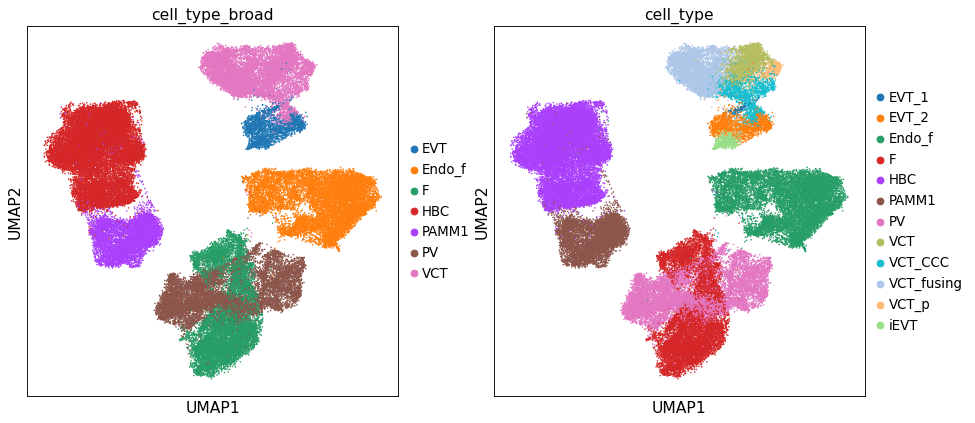

In [84]:
sc.pl.umap(adata, color=['cell_type_broad','cell_type' ],legend_fontsize=12, size=8)

In [85]:
#stage= adata.obs['stage']

## Creating Stage: Infection+hpi

In [86]:
adata.obs['stage']= adata.obs['infection'].astype('string')+'_'+ adata.obs['hpi'].astype('string')

In [87]:
#Removing useless columns in metadata
adata.obs= adata.obs.drop(columns=['batch','is_doublet','infection_stage'])

## Creating stage_perInfection: Infection + pathogen + hpi

In [88]:
adata.obs['stage_perInfection']=adata.obs['stage'].astype('string')

In [89]:
#Listeria controls
#adata.obs.loc[adata.obs['sample']=='Pla_HDBR12330712', 'stage_perInfection']= 'UI_Lm_24h'
#adata.obs.loc[adata.obs['sample']=='Pla_HDBR13661571', 'stage_perInfection']= 'UI_Lm_24h'
adata.obs.loc[adata.obs['sample']=='Pla_HDBR12330714', 'stage_perInfection']= 'UI_Lm_48h'
adata.obs.loc[adata.obs['sample']=='Pla_HDBR13661575', 'stage_perInfection']= 'UI_Lm_48h'

#Malaria controls
#adata.obs.loc[adata.obs['sample']=='Pla_HDBR11345033', 'stage_perInfection']= 'UI_Pf_24h'
#adata.obs.loc[adata.obs['sample']=='Pla_HDBR12966647', 'stage_perInfection']= 'UI_Pf_24h'
#adata.obs.loc[adata.obs['sample']=='Pla_HDBR13661565', 'stage_perInfection']= 'UI_Pf_24h'
adata.obs.loc[adata.obs['sample']=='Pla_HDBR13661567', 'stage_perInfection']= 'UI_Pf_48h'
#adata.obs.loc[adata.obs['sample']=='Pla_HDBR13661569', 'stage_perInfection']= 'UI_Pf_24h'
adata.obs.loc[adata.obs['sample']=='Pla_HDBR13661573', 'stage_perInfection']= 'UI_Pf_48h'

#Toxoplasma controls
#adata.obs.loc[adata.obs['sample']=='Pla_HDBR13007974', 'stage_perInfection']= 'UI_Tg_24h'
adata.obs.loc[adata.obs['sample']=='Pla_HDBR13007976', 'stage_perInfection']= 'UI_Tg_48h'
#adata.obs.loc[adata.obs['sample']=='Pla_HDBR13798223', 'stage_perInfection']= 'UI_Tg_24h'
adata.obs.loc[adata.obs['sample']=='Pla_HDBR13798225', 'stage_perInfection']= 'UI_Tg_48h'


In [90]:
adata.obs['stage_perInfection']= adata.obs['stage_perInfection'].astype('category')

In [91]:
set(adata.obs['stage_perInfection'])

{'Lm_48h', 'Pf_48h', 'Tg_48h', 'UI_Lm_48h', 'UI_Pf_48h', 'UI_Tg_48h'}

### Category concatenating the indentity + infections + day

In [92]:
adata.obs['celltype-Stage']= adata.obs.cell_type.astype('string')+'-'+adata.obs.stage_perInfection.astype('string')

In [93]:
adata.obs.donor_id

Pla_HDBR13007976_AAACCCAAGCCTCATA    scDonor_Tg2
Pla_HDBR13007976_AAACCCAAGCTGTTAC    scDonor_Tg1
Pla_HDBR13007976_AAACCCAAGGCATCAG    scDonor_Tg2
Pla_HDBR13007976_AAACCCACACTAAACC    scDonor_Tg2
Pla_HDBR13007976_AAACCCACACTACGGC    scDonor_Tg1
                                        ...     
Pla_HDBR13661576_TTTGTTGCATCCCGTT         Hrv236
Pla_HDBR13661576_TTTGTTGGTACAGCGA         Hrv236
Pla_HDBR13661576_TTTGTTGGTTTCGGCG         Hrv236
Pla_HDBR13661576_TTTGTTGTCAGCTGAT         Hrv236
Pla_HDBR13661576_TTTGTTGTCTGGTTGA         Hrv236
Name: donor_id, Length: 68045, dtype: category
Categories (8, object): ['Hrv136', 'Hrv232', 'Hrv236', 'donor_doublets', 'scDonor_Tg1', 'scDonor_Tg2', 'scDonor_Tg3', 'scDonor_Tg4']

## Category for intracellular Toxoplasma

In [94]:
#taking all donors from Tg infection
adataTg= adata[[ i in ['scDonor_Tg1', 'scDonor_Tg2','scDonor_Tg3', 'scDonor_Tg4']  for i in adata.obs.donor_id ]]

In [95]:
#Selecting on/nfs/team292/er13/PlacInfection_revision/ng from infected assays
adata_Infected =adataTg[[ i in ['Tg'] for i in adataTg.obs.infection ]]

In [96]:
### Creating new category for intracellular Tg 

#COpying the value of the leiden cluster. The new column will help to change it's values for
# the cluster identity
adata_Infected.obs['Tg_intracellular']= adata_Infected.obs['Tg_infected']




#Function that changes the cluster names as indicated
adata_Infected.obs['Tg_intracellular'] = (adata_Infected.obs["Tg_infected"].map(lambda x: 
                            {"True": "Intracellular-Tg", "False": "No_intracellular-Tg"}
                            .get(x, x)).astype("category"))

Trying to set attribute `.obs` of view, copying.


### Category concatenating the indentity + Intracellular Tg + day

In [97]:
adata_Infected.obs['celltype-Intracellular']= adata_Infected.obs.cell_type.astype('string')+'-'+adata_Infected.obs.Tg_intracellular.astype('string')

### Adding intracellular column to the whole object

In [98]:
#COpying the value of Tg_infected. The new column will help to change it's values for
# the cluster identity
adata.obs['Tg_intracellular']= adata.obs['Tg_infected']




#Function that changes the cluster names as indicated
adata.obs['Tg_intracellular'] = (adata.obs["Tg_infected"].map(lambda x: 
                            {"True": "Tg", "False": "UI",'nan':'nan'}
                            .get(x, x)).astype("category"))

In [99]:
#Updating the intracellular annotation by tranferring the annotation
adata= identityTransfer(adata_Infected, adata, field='Tg_intracellular')

### Adding Category concatenating the indentity + Intracellular Tg + day

In [100]:
adata.obs['celltype-Intracellular']=adata.obs['celltype-Stage']

In [101]:
#Updating the intracellular annotation by tranferring the annotation
adata= identityTransfer(adata_Infected, adata, field='celltype-Intracellular')

In [102]:
adata.obs['celltype-Intracellular'].head()

Pla_HDBR13007976_AAACCCAAGCCTCATA           HBC-UI_Tg_48h
Pla_HDBR13007976_AAACCCAAGCTGTTAC    VCT_fusing-UI_Tg_48h
Pla_HDBR13007976_AAACCCAAGGCATCAG           HBC-UI_Tg_48h
Pla_HDBR13007976_AAACCCACACTAAACC    VCT_fusing-UI_Tg_48h
Pla_HDBR13007976_AAACCCACACTACGGC    VCT_fusing-UI_Tg_48h
Name: celltype-Intracellular, dtype: category
Categories (93, object): ['EVT_1-Lm_48h', 'EVT_1-No_intracellular-Tg', 'EVT_1-Tg_48h', 'EVT_1-UI_Lm_48h', ..., 'iEVT-Tg_48h', 'iEVT-UI_Lm_48h', 'iEVT-UI_Pf_48h', 'iEVT-UI_Tg_48h']

### Saving the data

In [103]:
adata.X=adata.layers['raw_counts'].copy()

In [104]:
adata.write('../results/scVI/rna7_scVIintegrated_latent30_All_20230707.h5ad')

... storing 'stage' as categorical
... storing 'celltype-Stage' as categorical


In [ ]:
adata.write('/nfs/team292/er13/PlacInfection_revision/results/scVI/rna7_scVIintegrated_latent30_All_20230707_48h.h5ad')

Checking that the raw counts are still there

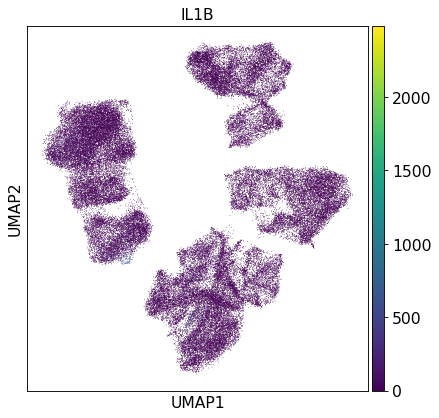

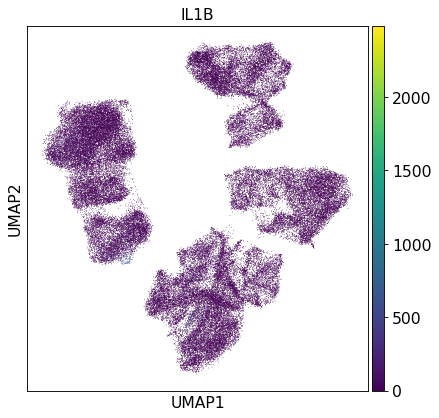

In [112]:
# use scVI imputed values for plotting
sc.pl.umap(adata, color=['IL1B' ],legend_fontsize='xx-small', layer='raw_counts')
sc.pl.umap(adata, color=['IL1B' ],legend_fontsize='xx-small',use_raw=False)

### Setting up color palette for future plots

In [105]:
#DF with the row names as the identity of the cells
colors_final_df = pd.DataFrame(index = np.unique(adata.obs['cell_type']))


#Assign each color per cell type under the column color

#colors_final_df.loc['SCT', 'color'] = '#f779a3'
colors_final_df.loc['VCT', 'color'] = '#b27ab4'
colors_final_df.loc['VCT_fusing', 'color'] = '#b53179'
colors_final_df.loc['VCT_p', 'color'] = '#993f98'
colors_final_df.loc['VCT_CCC', 'color'] = '#e2a7c8'

colors_final_df.loc['iEVT', 'color'] = '#0069b4'
colors_final_df.loc['EVT_1', 'color'] = '#009999'
colors_final_df.loc['EVT_2', 'color'] = '#03f9f2'


colors_final_df.loc['Endo_f', 'color'] = '#3f752d'
colors_final_df.loc['F', 'color'] = '#6bb300'


colors_final_df.loc['PV', 'color'] = '#d6ff99'


colors_final_df.loc['HBC', 'color'] = '#db5669'
colors_final_df.loc['PAMM1', 'color'] = '#f7e55e'

colors_final_dict= colors_final_df.to_dict()['color']

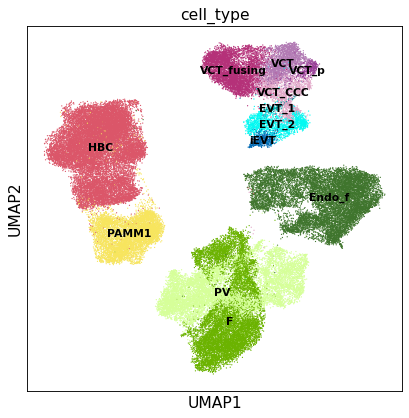

In [106]:
sc.pl.umap(adata, color=['cell_type'], palette= colors_final_dict, legend_loc='on data',legend_fontsize='x-small', size=5)



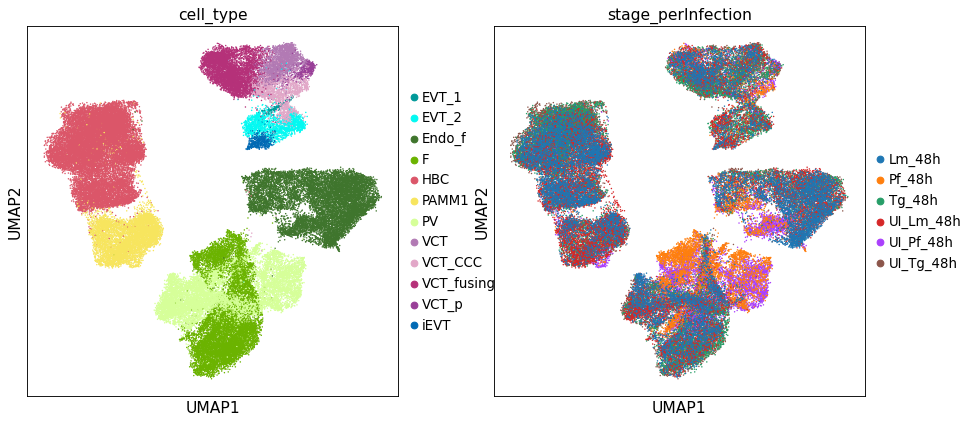

In [107]:
sc.pl.umap(adata, color=['cell_type','stage_perInfection'],  size=7,legend_fontsize=12)

---

# Saving the data into a Single cell experiment object for R

Use only if you need to save this object into R. This code takes many minutes to run and cosumes a lot of memory

### Note 
To run this chunk you need:

*rpy2==3.4.2  ///  anndata2ri==1.0.6*

In [34]:
adata_Milo= adata.copy()
adata_Milo.obsp=None

del(adata_Milo.uns)
del(adata_Milo.obsm['X_scVI_n_latent_20'])
del(adata_Milo.obsm['X_scVI_n_latent_40'])
adata_Milo

AnnData object with n_obs × n_vars = 81906 × 36601
    obs: 'sample', 'day', 'infection', 'percent_mito', 'n_counts', 'sample_barcode', 'assignment_SoC', 'donor_id', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'stage', 'infection_stage', 'S_score', 'G2M_score', 'phase', 'n_genes', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'Tg_infected', 'leiden_scvi', 'celltype_predictions', 'probabilities', 'scrublet_doublet', 'identity', 'souporcell_MFgenotype', 'MFgenotype', 'identity_broad'
    var: 'gene_ids', 'feature_types', 'mean-0', 'std-0', 'mean-1', 'std-1', 'mean-2', 'std-2', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    obsm: 'X_scVI_n_latent_30', 'X_umap', '_scvi_extra_categoricals'
    layers: 'raw_counts'

In [5]:
bdata= adata[1:500]

In [8]:
bdata = anndata.AnnData(X = bdata.layers['raw_counts'], var = bdata.var, obs = bdata.obs)
bdata.var= bdata.var.drop(columns='highly_variable_rank')

In [9]:
%%R -i bdata
bdata

class: SingleCellExperiment 
dim: 36601 499 
metadata(0):
assays(1): X
rownames(36601): TSN MTRNR2L7 ... FES PRB1
rowData names(12): gene_ids feature_types ... variances variances_norm
colnames(499): Pla_HDBR13007974_AAACCCAAGTAGTCAA
  Pla_HDBR13007974_AAACCCACAATGAACA ...
  Pla_HDBR13007974_ACAAAGAAGGTCATCT Pla_HDBR13007974_ACAAAGAAGTAACGAT
colData names(32): sample day ... MFgenotype identity_broad
reducedDimNames(0):
altExpNames(0):


In [ ]:
bdata

In [ ]:
#----

In [7]:
import anndata
import scanpy as sc

In [17]:
bdata = anndata.AnnData(X = adata.layers['raw_counts'], var = adata.var, obs = adata.obs)

In [18]:
bdata.var= bdata.var.drop(columns='highly_variable_rank')

In [6]:
#Import in this order
import rpy2.robjects.numpy2ri
import rpy2.rinterface_lib.callbacks
import logging
# Ignore R warning messages
#Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)
rpy2.robjects.numpy2ri.activate()

import anndata2ri
anndata2ri.activate()
%load_ext rpy2.ipython

In [13]:
#%%R -i adata_Milo
#adata_Milo

In [20]:
%%R -i bdata
bdata

class: SingleCellExperiment 
dim: 36601 81906 
metadata(0):
assays(1): X
rownames(36601): TSN MTRNR2L7 ... FES PRB1
rowData names(12): gene_ids feature_types ... variances variances_norm
colnames(81906): Pla_HDBR13007974_AAACCCAAGCGTTGTT
  Pla_HDBR13007974_AAACCCAAGTAGTCAA ...
  Pla_HDBR12330715_TTTGTTGTCGCCAGAC Pla_HDBR12330715_TTTGTTGTCGGACTTA
colData names(32): sample day ... MFgenotype identity_broad
reducedDimNames(0):
altExpNames(0):


In [21]:
%%R -i bdata
library(Seurat)
so = as.Seurat(bdata, counts = "X", data = "X")
saveRDS(so, file = "../results/scVI/rna8_scVIintegrated_latent30_All_20220830_seurat.rds")


Error in library(Seurat) : there is no package called ‘Seurat’


In [22]:
%%R -i bdata
saveRDS(bdata, file = "../results/scVI/rna8_scVIintegrated_latent30_All_20220830.rds")
bdata

class: SingleCellExperiment 
dim: 36601 81906 
metadata(0):
assays(1): X
rownames(36601): TSN MTRNR2L7 ... FES PRB1
rowData names(12): gene_ids feature_types ... variances variances_norm
colnames(81906): Pla_HDBR13007974_AAACCCAAGCGTTGTT
  Pla_HDBR13007974_AAACCCAAGTAGTCAA ...
  Pla_HDBR12330715_TTTGTTGTCGCCAGAC Pla_HDBR12330715_TTTGTTGTCGGACTTA
colData names(32): sample day ... MFgenotype identity_broad
reducedDimNames(0):
altExpNames(0):
